In [1]:
##%matplotlib widget
## with %matplotlib notebook: seems to require ipympl as part of environment, either
## part of the conda environment or "pip install ipympl"
## otherwise, does not show ANY plots in notebook, plt.savefig() works
%matplotlib notebook  
##%matplotlib inline    ## --plt.savefig()  works, but re-sizing does NOT


## Imports

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import time
import torch
import pandas as pd

# Python 3 standard library
from pathlib import Path

from model.efficiency import pv_locations, efficiency

import mplhep as hep
##hep.set_style("LHCb2")
plt.style.use(hep.style.ROOT)

##from torchsummary import summary

## Get the helper functions

Add the directory with the model
definitions to the path so we can import from it:

> When you type `import X`,
Python searches `sys.path` for a python
file named `X.py` to import. So we need to add the model directory to the path.

In [3]:
# From model/collectdata.py
from model.collectdata_kde_Ellipsoids import collect_t2kde_data
from model.collectdata_mdsA  import collect_truth

# From model/loss.py
##from loss import Loss
##from model.kde_loss_D import Loss
# from model.kde_loss_B import Loss


##from model.models_kde import TracksToKDE_Ellipsoids_DirtyDozen as Model

from model.models_kde import TracksToKDE_Ellipsoids_DDplus as Model
#from model.models_kde import TracksToKDE_Ellipsoids_DDplus_noDropOut as Model

from model.training_kde import trainNet, select_gpu, Results
from model.plots import dual_train_plots, replace_in_ax

In [4]:
# This gets built up during the run - do not rerun this cell
results = pd.DataFrame([], columns=Results._fields)

Set up Torch device configuration. All tensors and model parameters need to know where to be put.
This takes a BUS ID number: The BUS ID is the same as the listing at the top of this script.

In [5]:
##device = select_gpu(0)
device = "cpu"

## Loading data

Load the dataset, split into parts, then move to device (see `collectdata.py` in the `../model` directory)

In [6]:
# Validation dataset. You can slice to reduce the size.
## mds no separate validation set yet,
batch_size = 16
val_loader = collect_t2kde_data('dataAA/20K_POCA_kernel_evts_200926.h5',
                                batch_size=batch_size,
                                device=device,
                                slice = slice(0,20))

PV = collect_truth('dataAA/20K_POCA_kernel_evts_200926.h5', pvs=True)
print('PV.n.shape =    ',  PV.n.shape)
print('PV.n[0].shape = ', *PV.n[0].shape)
print('PV.x[0] =       ', *PV.x[0])
print('PV.y[0] =       ', *PV.y[0])
print('PV.z[0] =       ', *PV.z[0])
print('PV.n[0] =       ', *PV.n[0])
print('PV.cat[0] =     ', *PV.cat[0])

SV = collect_truth('dataAA/20K_POCA_kernel_evts_200926.h5', pvs=False)
print('SV.n.shape =    ', SV.n.shape)
print('SV.n[0].shape = ', *SV.n[0].shape)
print('SV.x[0] =       ', *SV.x[0])
print('SV.y[0] =       ', *SV.y[0])
print('SV.z[0] =       ', *SV.z[0])
print('SV.n[0] =       ', *SV.n[0])
print('SV.cat[0] =     ', *SV.cat[0])


Loading data...
pocaMx.shape =  (20000,)
nEvts =  20000
len(pocaMx[0]) =  211
len(pocaMx[1]) =  21
len(pocaMx[2]) =  20
len(pocaMx[3]) =  198
len(pocaMx[4]) =  233
majorAxis.shape =  (20000, 3)
minorAxis_1.shape =  (20000, 3)
minorAxis_2.shape =  (20000, 3)
have entered six_ellipsoid_parameters
  
 
  nEvts =  20000
 iEvt, nTrks =  0 211
 iEvt, nTrks =  1 21
 iEvt, nTrks =  2 20
 iEvt, nTrks =  3 198
 iEvt, nTrks =  4 233
 iEvt, nTrks =  5 85
 iEvt, nTrks =  6 223
 iEvt, nTrks =  7 425
 iEvt, nTrks =  8 252
 iEvt, nTrks =  9 169
A.shape =  (20000,)
majorAxis[iTrk][0][0] =  -0.00023452607
majorAxis[iTrk][1][0] =  -0.00047206535
majorAxis[iTrk][2][0] =  0.096502915
minorAxis_1[iTrk][0][0] =  -15.822749
minorAxis_1[iTrk][1][0] =  7.8608756
minorAxis_1[iTrk][2][0] =  -2.6228399e-08
minorAxis_2[iTrk][0][0] =  7.860759
minorAxis_2[iTrk][1][0] =  15.822513
minorAxis_2[iTrk][2][0] =  0.096502915
  
majorAxis[iTrk][0][0] =  -0.37655562
majorAxis[iTrk][1][0] =  0.2768704
majorAxis[iTrk][2][0] = 

# Preparing the models

Prepare the trained models, use multiple GPUs if they are VISIBLE, and move the models to the device.

In [7]:
nOut1 = 50
nOut2 = 50
nOut3 = 50
nOut4 = 50
nOut5 = 50
nOut6 = 50
nOut7 = 50
nOut8 = 50
nOut9 = 50
nOut10 = 50
nOut11 = 50
latentChannels = 4
models = {}
models_dict = {}

for i in range(50):
    models[i] = Model(nOut1,nOut2,nOut3,nOut4,nOut5,nOut6,nOut7,nOut8,nOut9,nOut10,nOut11,latentChannels)
    models_dict[i] = models[i].state_dict()
#model_latest = Model(nOut1,nOut2,nOut3,nOut4,nOut5,nOut6,nOut7,nOut8,nOut9,nOut10,nOut11,latentChannels)
#model_old = Model(nOut1,nOut2,nOut3,nOut4,nOut5,nOut6,nOut7,nOut8,nOut9,nOut10,nOut11,latentChannels)

In [8]:
folders = {}
for i in range(50):
    folders[i] = ''
    
#folders[1]  = '22December_testing_DDplus_loss_Bb_iter1_floatAll_100epochs_1em5'
#folders[4]  = '25December__DDplus_loss_Ba_iter4_floatAll_500epochs_1em5'
#folders[7]  = '25December__DDplus_loss_Ba_iter7_floatAll_800epochs_4em6'
#folders[27] = '05Feb_DDplus_loss_Ba_iter27_floatAll_100epochs_1p5em5_4xwill'
#folders[28] = '06Feb_DDplus_loss_Ba_iter28_floatAll_100epochs_1p5em5_4xwill'
folders[29] = '07Feb_DDplus_loss_Ba_iter29_floatAll_100epochs_1p5em5_4xwill'
iters = [29]
mycolors = {29:'red'}
#iters = [1,7,27,28,29]
#mycolors = {1:'green',7:'darkorange',27:'red',28:'magenta',29:'gold'}

'''
##folder = '20December_testing_DDplus_first_learning_10epochs_1em4'
## folder = '20December_testing_DDplus_iter1_20epochs_1em4'
##folder = '20December_testing_DDplus_iter2_floatAll_50epochs_1em4'
##folder = '20December_testing_DDplus_iter4_floatAll_200epochs_6em5'
##folder = '20December_testing_DDplus_loss_Ba_iter1_floatAll_100epochs_1em3'
##folder = '20December_testing_DDplus_loss_Ba_iter2_floatAll_700epochs_2em4'
folder = '21December_testing_DDplus_loss_Ba_iter4_floatAll_700epochs_5em6'
##folder = '20December_testing_DDplus_loss_Ba_iter2_floatAll_700epochs_5em5'
folder = '22December_testing_DDplus_loss_Bb_iter0_floatAll_20epochs_1em4'
folder = '22December_testing_DDplus_loss_Bb_iter1_floatAll_100epochs_1em5'
folder = '22December_testing_DDplus_loss_Bb_iter2_floatAll_100epochs_3em6'  ## final training cost 1.31031
##folder = '22December_testing_DDplus_loss_Bb_realBb_iter0A_floatAll_50epochs_1em5'
##folder = '22December_testing_DDplus_loss_Bb_realBb_iter2A_floatAll_100epochs_2em6'
##folder = '22December_testing_DDplus_loss_Bb__iter0c_floatAll_fromScratch_20epochs_1em3'
folder = '25December__DDplus_loss_Ba_iter4_floatAll_500epochs_1em5'
folder = '25December__DDplus_loss_Ba_iter5_floatAll_800epochs_1em5'
folder = '25December__DDplus_loss_Ba_iter5_floatAll_800epochs_5em6'  ## really iter6, really Dec. 27
folder_old = '25December__DDplus_loss_Ba_iter7_floatAll_800epochs_4em6'
folder_latest = '05Feb_DDplus_loss_Ba_iter%s_floatAll_100epochs_1p5em5_4xwill'%(nIter)
'''

"\n##folder = '20December_testing_DDplus_first_learning_10epochs_1em4'\n## folder = '20December_testing_DDplus_iter1_20epochs_1em4'\n##folder = '20December_testing_DDplus_iter2_floatAll_50epochs_1em4'\n##folder = '20December_testing_DDplus_iter4_floatAll_200epochs_6em5'\n##folder = '20December_testing_DDplus_loss_Ba_iter1_floatAll_100epochs_1em3'\n##folder = '20December_testing_DDplus_loss_Ba_iter2_floatAll_700epochs_2em4'\nfolder = '21December_testing_DDplus_loss_Ba_iter4_floatAll_700epochs_5em6'\n##folder = '20December_testing_DDplus_loss_Ba_iter2_floatAll_700epochs_5em5'\nfolder = '22December_testing_DDplus_loss_Bb_iter0_floatAll_20epochs_1em4'\nfolder = '22December_testing_DDplus_loss_Bb_iter1_floatAll_100epochs_1em5'\nfolder = '22December_testing_DDplus_loss_Bb_iter2_floatAll_100epochs_3em6'  ## final training cost 1.31031\n##folder = '22December_testing_DDplus_loss_Bb_realBb_iter0A_floatAll_50epochs_1em5'\n##folder = '22December_testing_DDplus_loss_Bb_realBb_iter2A_floatAll_100ep

In [9]:
# 'torch.no_grad()' is important to be used in combination of model.eval() [see below] 
#to correctly deactivate the dropout in the model during inference
torch.no_grad()

suffix = 'final'

weights_dicts = {}
pretrained_dicts = {}
for i in folders.keys():
    if not i in iters:
        continue
    rootDir = 'ML/'
    if i>18:
        rootDir = 'ML_dir/'        
    weights_dicts[i] = rootDir + folders[i] + '/' + folders[i] + '_'+ suffix + '.pyt'
    print(weights_dicts[i])
    pretrained_dicts[i] = torch.load(weights_dicts[i])
    # 1. filter out unnecessary keys
    pretrained_dicts[i] = {k: v for k, v in pretrained_dicts[i].items() if k in models_dict[i]}
    # 2. overwrite entries in the existing state dict
    models_dict[i].update(pretrained_dicts[i]) 
    # 3. load the new state dict
    models[i].load_state_dict(pretrained_dicts[i],strict=False)
    # 4. call the eval function of the model to allow disabling the Dropout of the conv layers.
    #    otherwise during inference, the Dropout is maintained, resulting in fluctuating outputs
    models[i].eval()

ML_dir/07Feb_DDplus_loss_Ba_iter29_floatAll_100epochs_1p5em5_4xwill/07Feb_DDplus_loss_Ba_iter29_floatAll_100epochs_1p5em5_4xwill_final.pyt


In [10]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 10
fig_size[1] = 4
plt.rcParams["figure.figsize"] = fig_size


output_folder = 'ML_dir/Tracks_to_KDE_TestTrainedModel/Model_DDplus_CompIters'
for it in iters:
    output_folder += '_%s'%(it)
output_path = Path(output_folder)
output_path.mkdir(exist_ok=True)


In [11]:
for i in models.keys():
    models[i].to(device)

In [12]:
# dict to store the outputs of the trained models (iteration over same model)
outputs = {}
# dict to store the predicted KDEs from the trained models (iteration over same model)
y_pred = {}

In [13]:
'''
nFeatures = 4000

with torch.no_grad():
    count = 0
    for inputs, labels in val_loader:
        print("count",count)
        if count>0:
            continue
        count+=1
        if inputs.device != device:
            inputs, labels = inputs.to(device), labels.to(device)
        
        # Loop over the trained iterations to retrieve the predictions 
        for it in iters:
            outputs[it] = models[it](inputs)
        
        # Get the number of events from the output of the first trained model 
        nEvts = outputs[iters[0]].shape[0]
        
        # Do something on the true distribution (KDEs) 
        y = labels.view(nEvts,-1,nFeatures)
        y = y.transpose(1,2)               
        
        # LOOP over the events
        for iEvt in range(nEvts):

            # --- Retrieve the TRUE KDEs
            y_kde = y[iEvt,:,0].cpu().numpy()
            # print("y_kde.shape = ",y_kde.shape)

            # --- Retrieve the PREDICTED KDEs for each trained model (iteration over same model)
            for it in iters:
                y_pred[it] = outputs[it][iEvt,:]
                y_pred[it] = y_pred[it].cpu().numpy()
                        
            
            if (iEvt<5):
                fig, ax = plt.subplots()
                plt.ylim(0.0005,1.15*max(y_kde))
                plt.plot(y_kde, color="royalblue", label="True KDE")
                for it in iters:
                    plt.plot(y_pred[it], color=mycolors[it], alpha = 0.8, label="Pred. KDE (iter %s)"%(it))
                plt.legend()
                textstr = '\n'.join((
                r'Evt #%s' % (iEvt, ),     
                ))              
                props = dict(boxstyle='square', facecolor='white', edgecolor='white', alpha=0.5) #
                ax.text(0.05, 0.95, textstr, transform=ax.transAxes,verticalalignment='top', bbox=props,linespacing = 1.8)#, fontsize=14
                ax.set_xlabel("z (in bin #)")
                ax.set_ylabel("Arbitrary unit")
                plt.show()
'''

'\nnFeatures = 4000\n\nwith torch.no_grad():\n    count = 0\n    for inputs, labels in val_loader:\n        print("count",count)\n        if count>0:\n            continue\n        count+=1\n        if inputs.device != device:\n            inputs, labels = inputs.to(device), labels.to(device)\n        \n        # Loop over the trained iterations to retrieve the predictions \n        for it in iters:\n            outputs[it] = models[it](inputs)\n        \n        # Get the number of events from the output of the first trained model \n        nEvts = outputs[iters[0]].shape[0]\n        \n        # Do something on the true distribution (KDEs) \n        y = labels.view(nEvts,-1,nFeatures)\n        y = y.transpose(1,2)               \n        \n        # LOOP over the events\n        for iEvt in range(nEvts):\n\n            # --- Retrieve the TRUE KDEs\n            y_kde = y[iEvt,:,0].cpu().numpy()\n            # print("y_kde.shape = ",y_kde.shape)\n\n            # --- Retrieve the PREDICT

In [14]:
'''
it = 29
print(it)
#print(models[29])
#print(models[29].conv1dropout)
#print(models[29].state_dict().keys())
#print((models[29].state_dict()["conv1.weight"][0][0]))
#print('max model:',max(models[29].state_dict()["conv1.weight"][0][0]))
#print(val_loader.dataset.tensors[0].shape)
#print(val_loader.dataset.tensors[1].shape)
#print('max val_loader:',max(val_loader.dataset.tensors[0][10][0]))

outputs[29] = models[29](val_loader.dataset.tensors[0])
print(outputs[29].shape)
print(outputs[29][0])

model = models[29].eval()
outp = model(val_loader.dataset.tensors[0])
print(outp.shape)
print(outp[0])
'''

'\nit = 29\nprint(it)\n#print(models[29])\n#print(models[29].conv1dropout)\n#print(models[29].state_dict().keys())\n#print((models[29].state_dict()["conv1.weight"][0][0]))\n#print(\'max model:\',max(models[29].state_dict()["conv1.weight"][0][0]))\n#print(val_loader.dataset.tensors[0].shape)\n#print(val_loader.dataset.tensors[1].shape)\n#print(\'max val_loader:\',max(val_loader.dataset.tensors[0][10][0]))\n\noutputs[29] = models[29](val_loader.dataset.tensors[0])\nprint(outputs[29].shape)\nprint(outputs[29][0])\n\nmodel = models[29].eval()\noutp = model(val_loader.dataset.tensors[0])\nprint(outp.shape)\nprint(outp[0])\n'

nEvts =  20
iEvt =  0


<IPython.core.display.Javascript object>


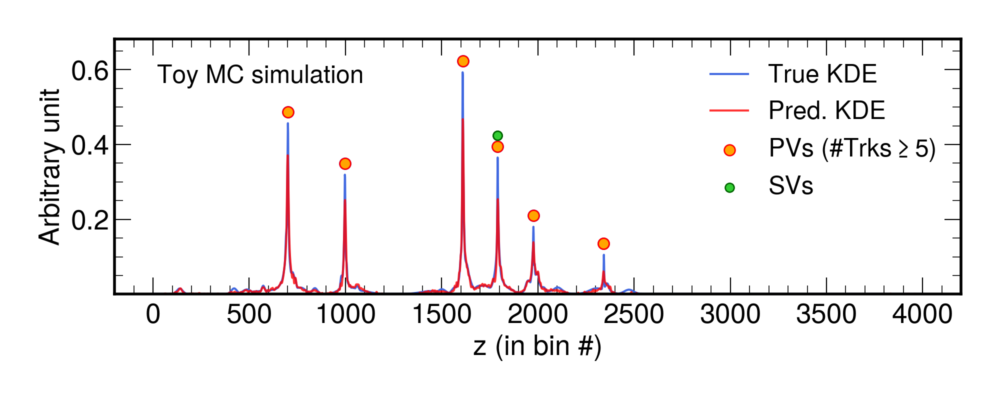

0.59277344 0.46767488
0.59277344


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (-29.881668, 1, 24) 701.0


<IPython.core.display.Javascript object>


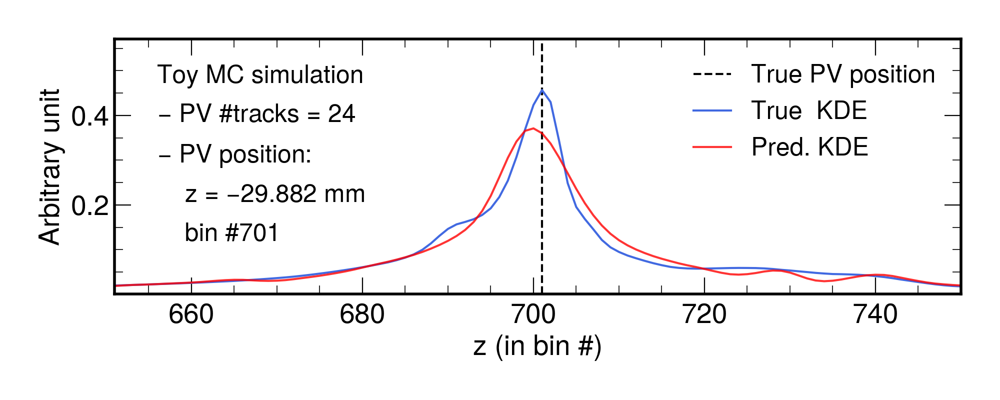

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (-0.15807877, 1, 10) 998.0


<IPython.core.display.Javascript object>


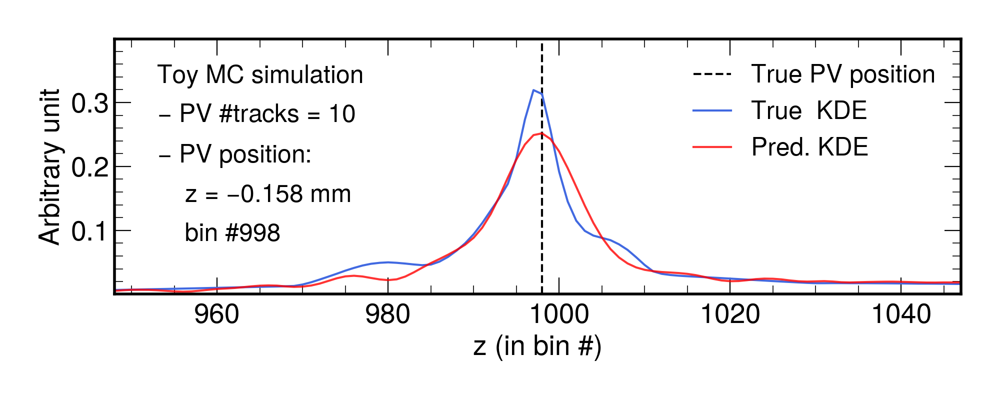

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (61.021088, 1, 26) 1610.0


<IPython.core.display.Javascript object>


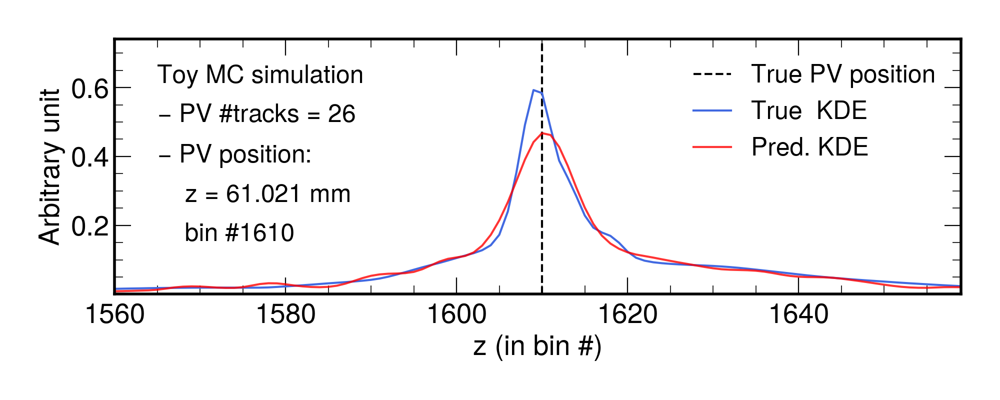

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (79.19783, 1, 19) 1791.0


<IPython.core.display.Javascript object>


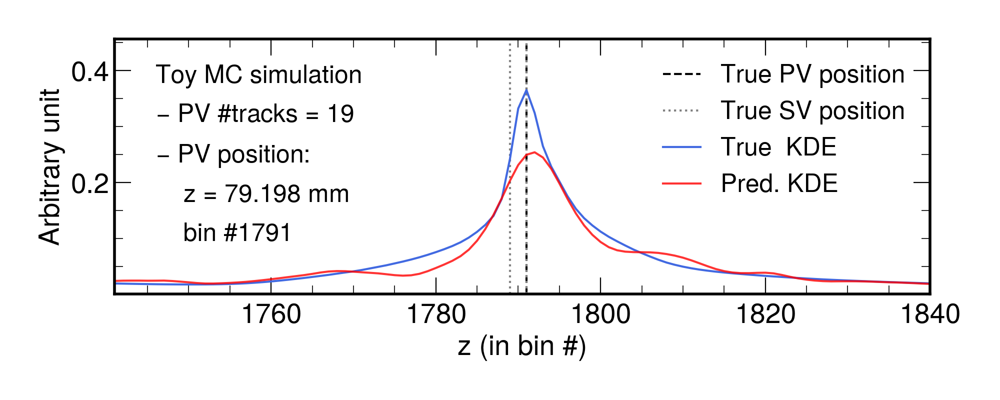

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (97.82085, 1, 24) 1978.0


<IPython.core.display.Javascript object>


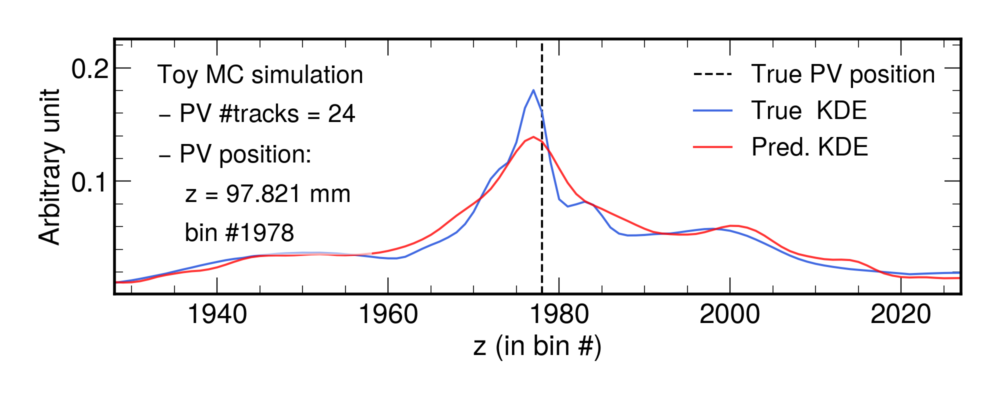

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (134.26784, 1, 7) 2342.0


<IPython.core.display.Javascript object>


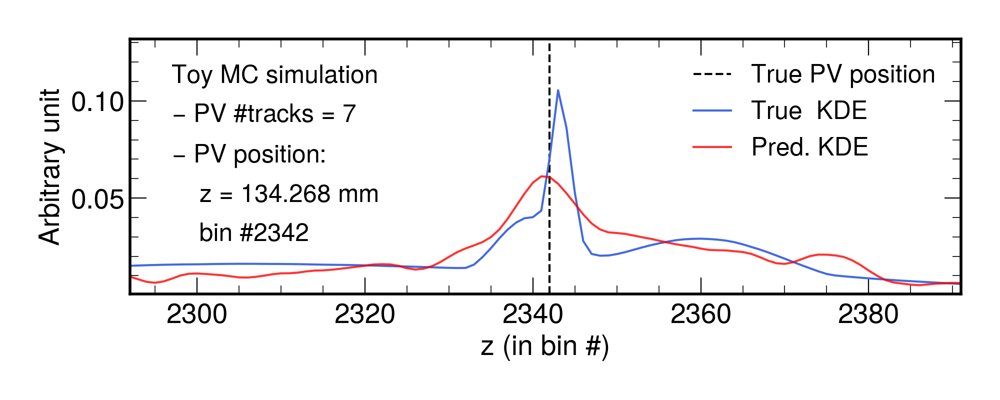

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  1


<IPython.core.display.Javascript object>


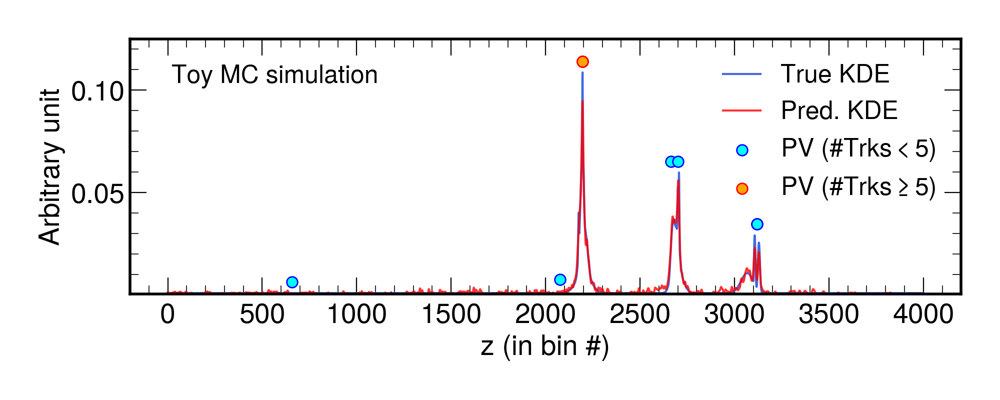

0.10864258 0.09474774
0.10864258


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (119.57261, 1, 7) 2195.0


<IPython.core.display.Javascript object>


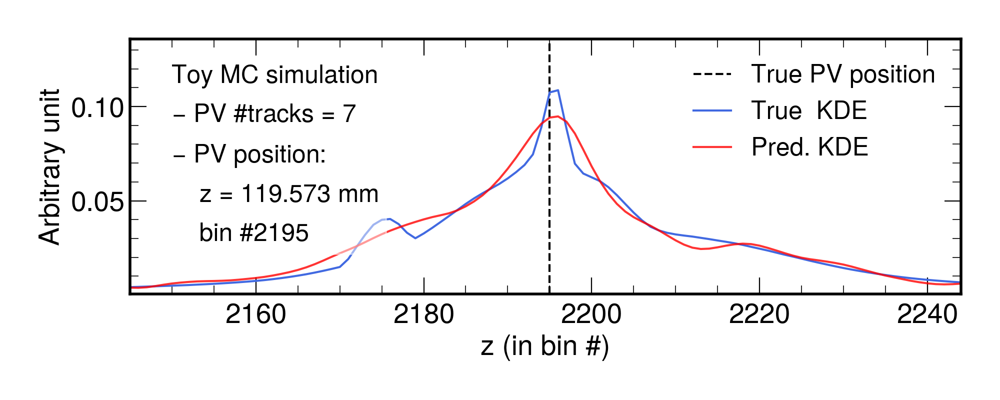

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  2


<IPython.core.display.Javascript object>


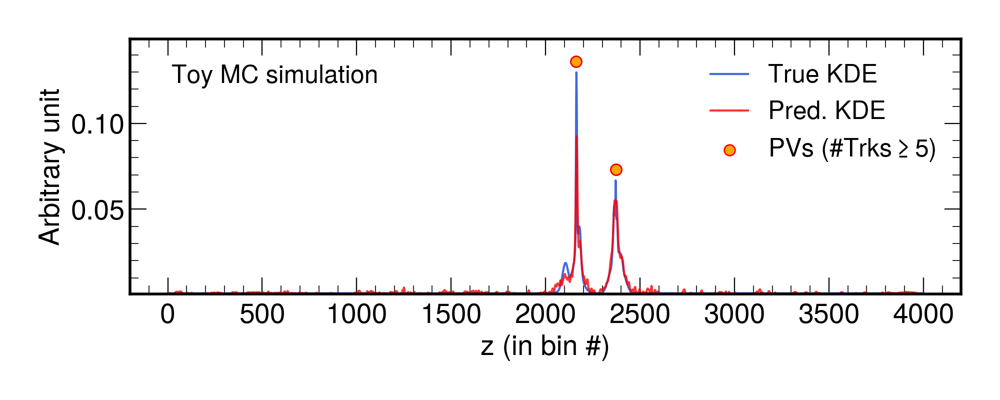

0.12976074 0.09253049
0.12976074


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (116.2301, 1, 5) 2162.0


<IPython.core.display.Javascript object>


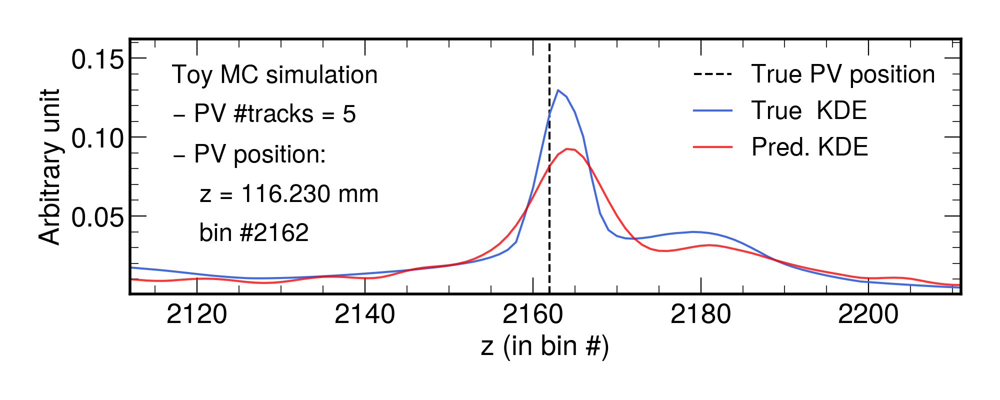

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (137.23302, 1, 7) 2372.0


<IPython.core.display.Javascript object>


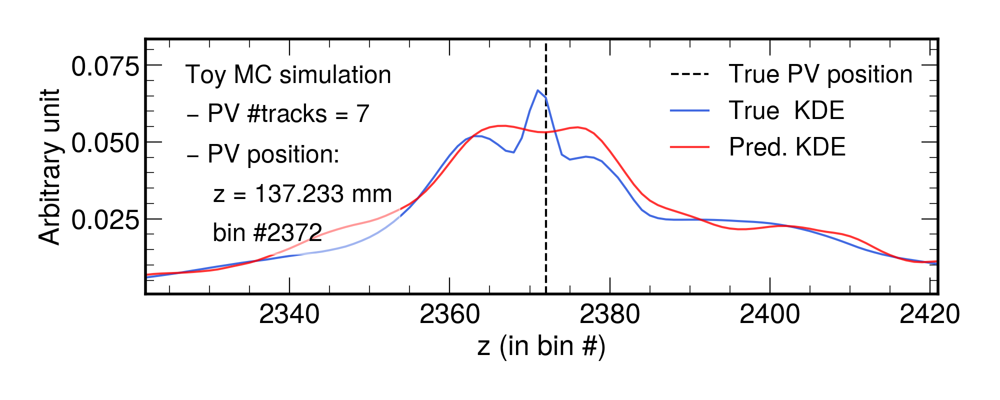

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  3


<IPython.core.display.Javascript object>


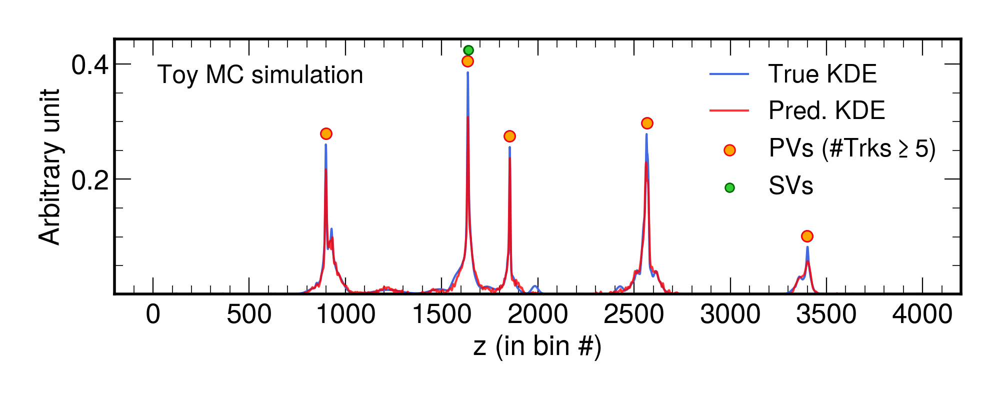

0.38549805 0.30790764
0.38549805


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (-9.917648, 1, 25) 900.0


<IPython.core.display.Javascript object>


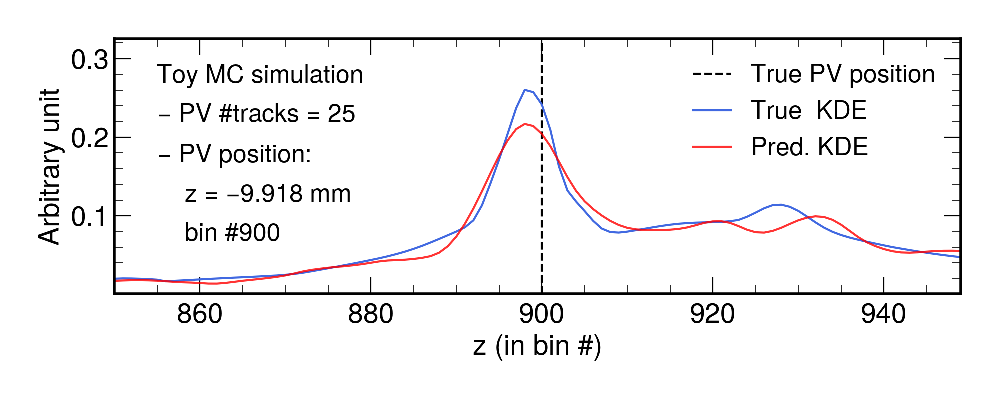

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (63.546913, 1, 28) 1635.0


<IPython.core.display.Javascript object>


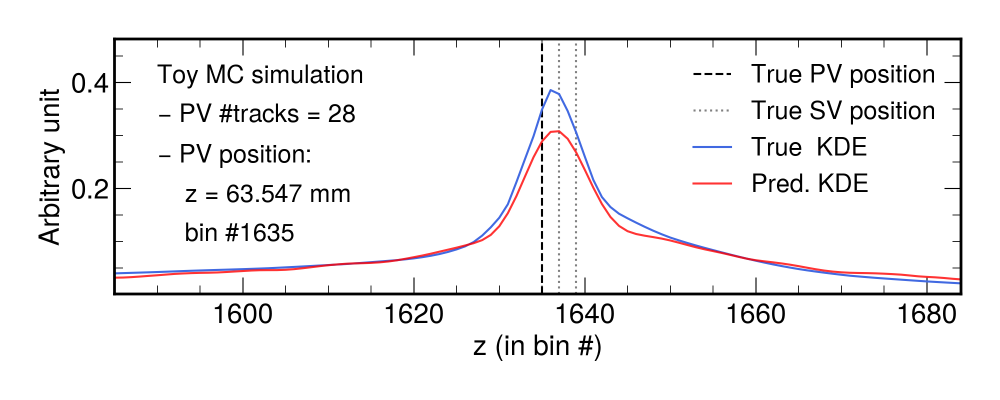

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (85.381065, 1, 13) 1853.0


<IPython.core.display.Javascript object>


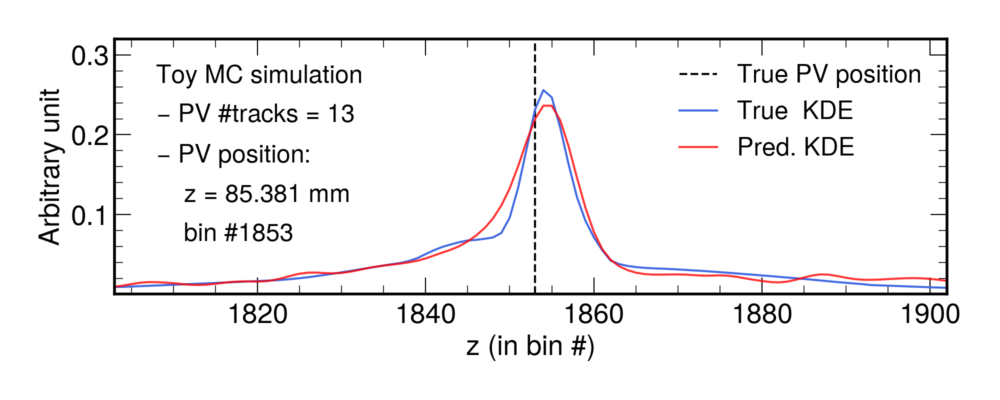

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (156.8066, 1, 42) 2568.0


<IPython.core.display.Javascript object>


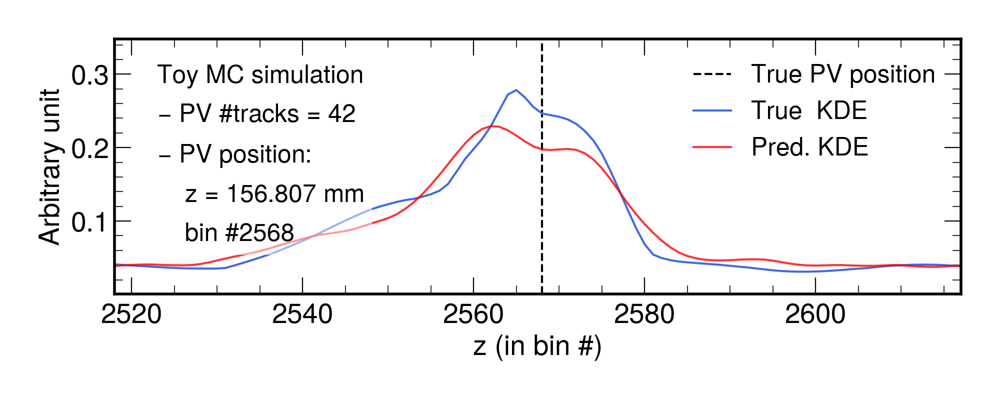

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (239.98242, 1, 11) 3399.0


<IPython.core.display.Javascript object>


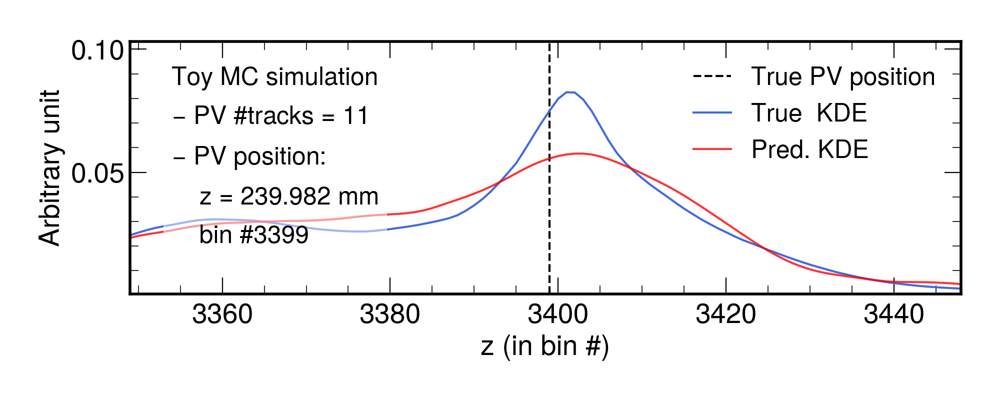

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  4


<IPython.core.display.Javascript object>


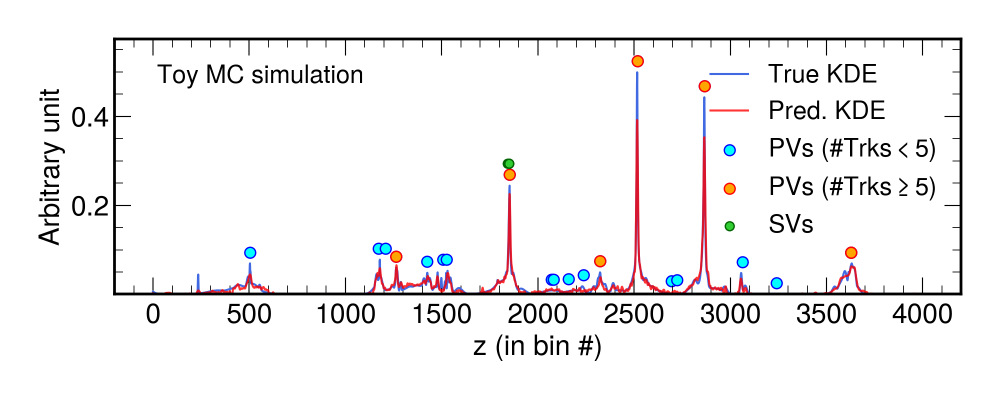

0.49926758 0.3920278
0.49926758


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (26.315554, 1, 7) 1263.0


<IPython.core.display.Javascript object>


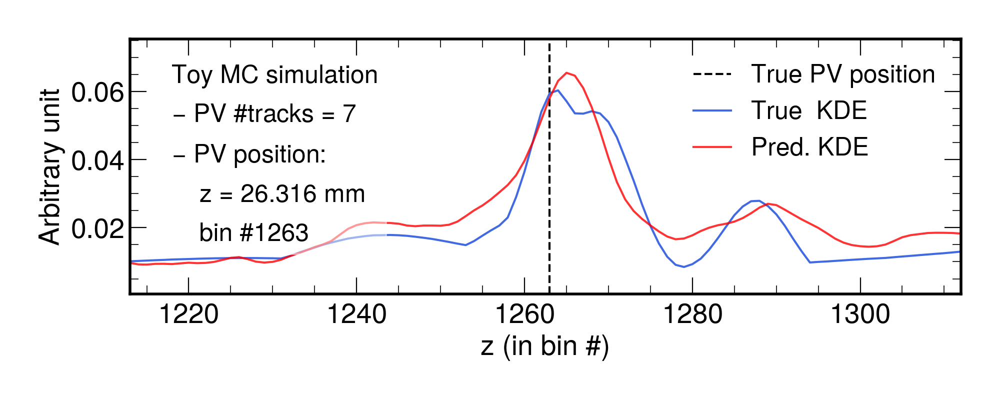

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (85.32848, 1, 17) 1853.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


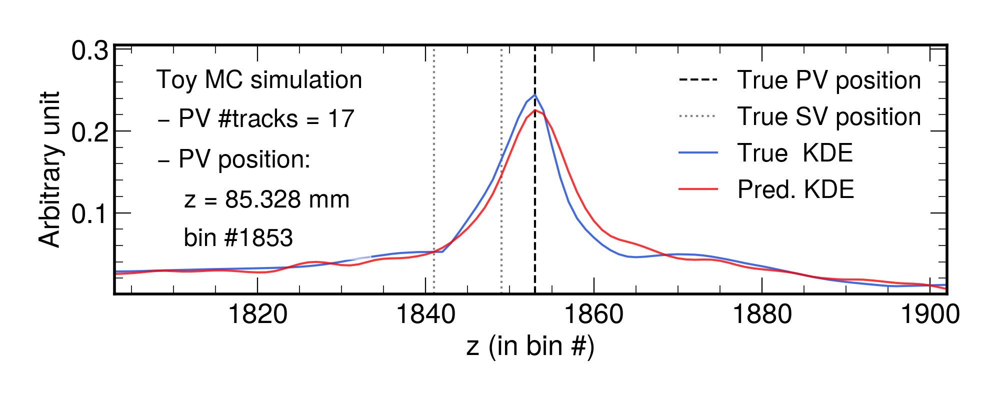

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (132.24886, 1, 7) 2322.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


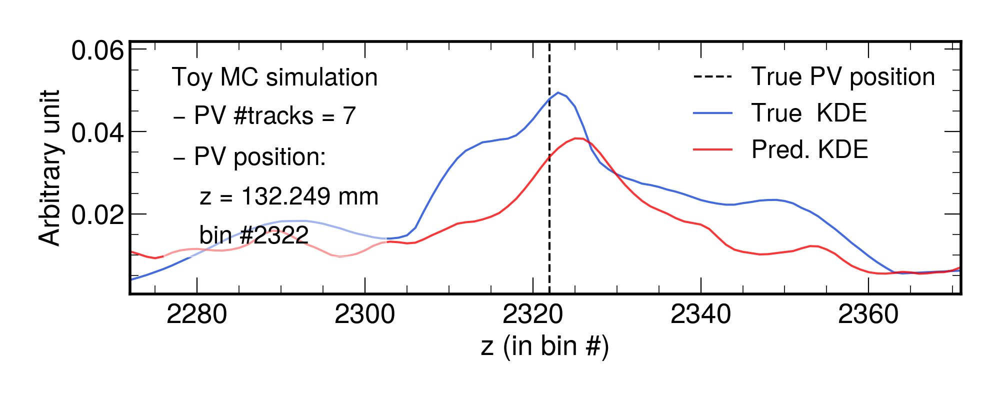

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (151.79068, 1, 22) 2517.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


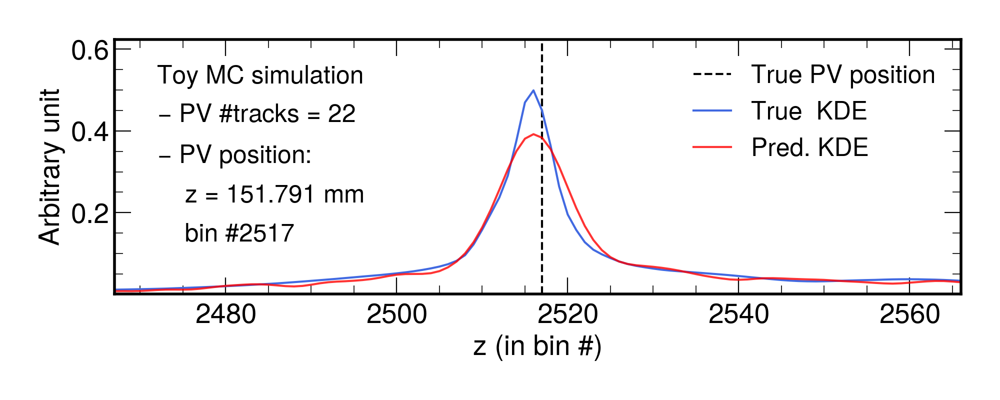

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (186.51968, 1, 24) 2865.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


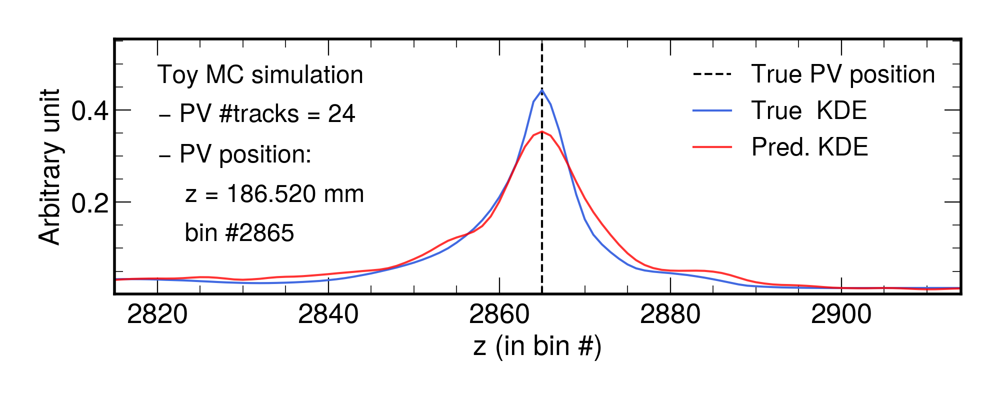

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (262.89627, 1, 23) 3628.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


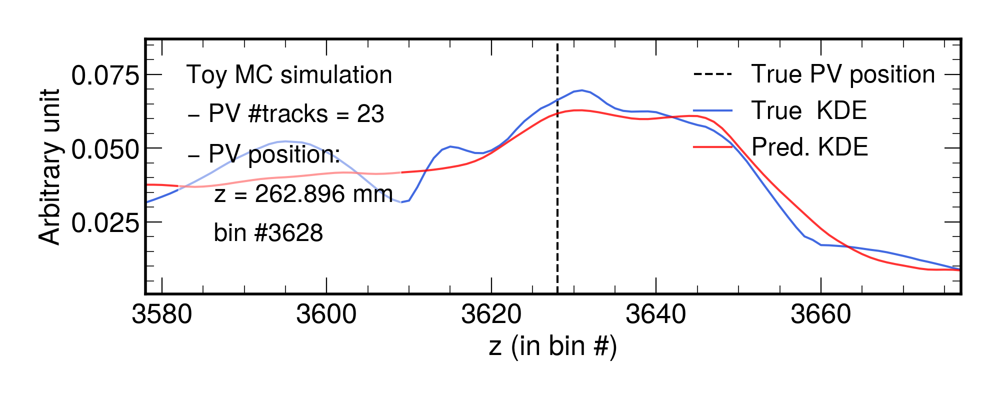

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  5


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


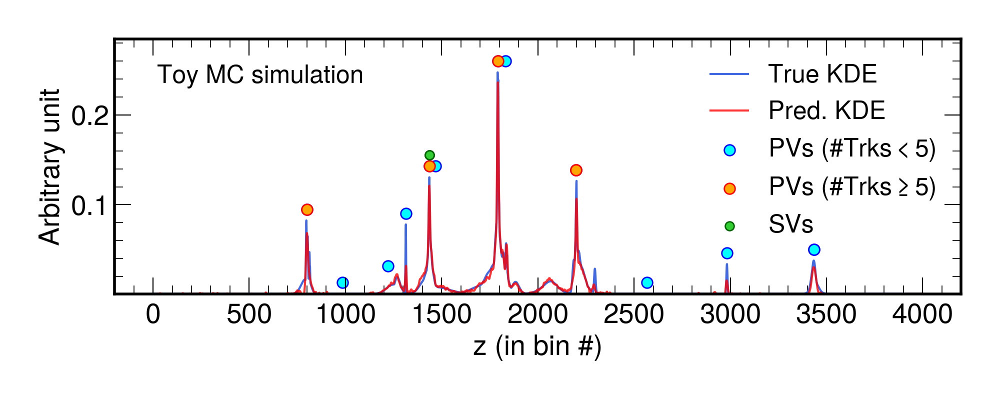

0.24743652 0.23619927
0.24743652


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (-19.927103, 1, 5) 800.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


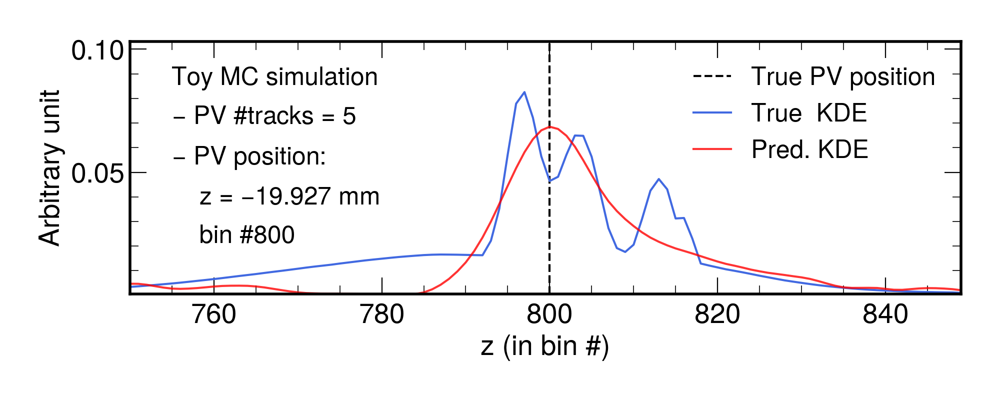

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (43.697105, 1, 9) 1436.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


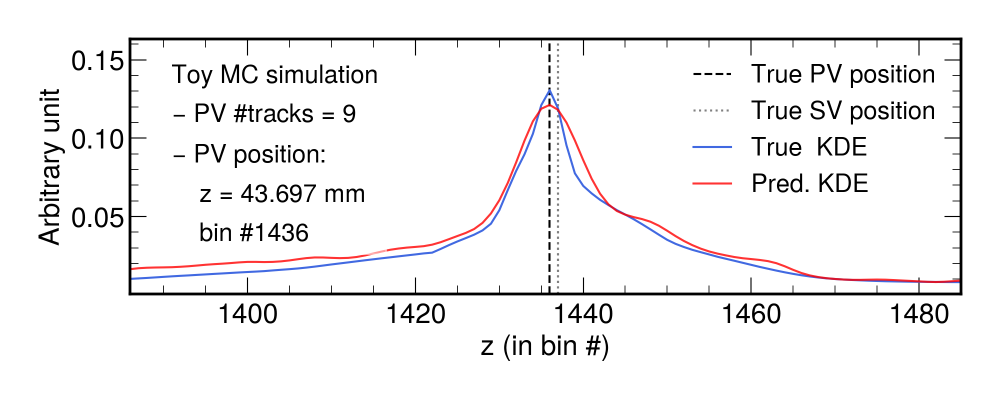

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (79.39985, 1, 13) 1793.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


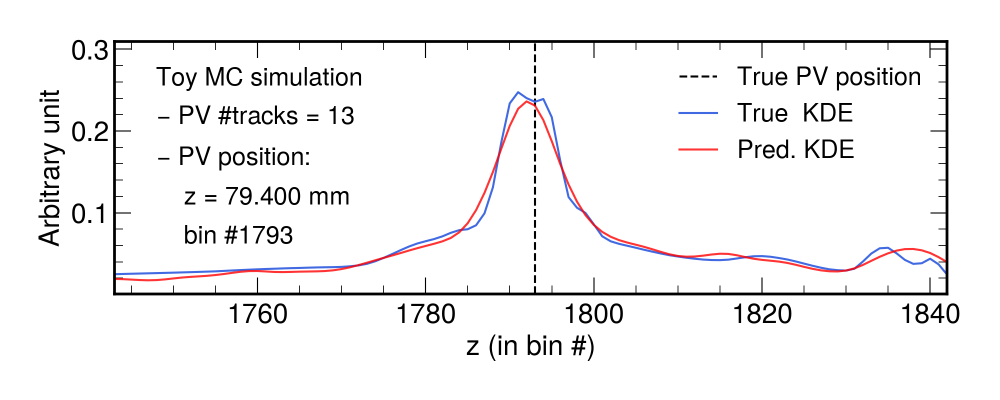

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (119.88787, 1, 7) 2198.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


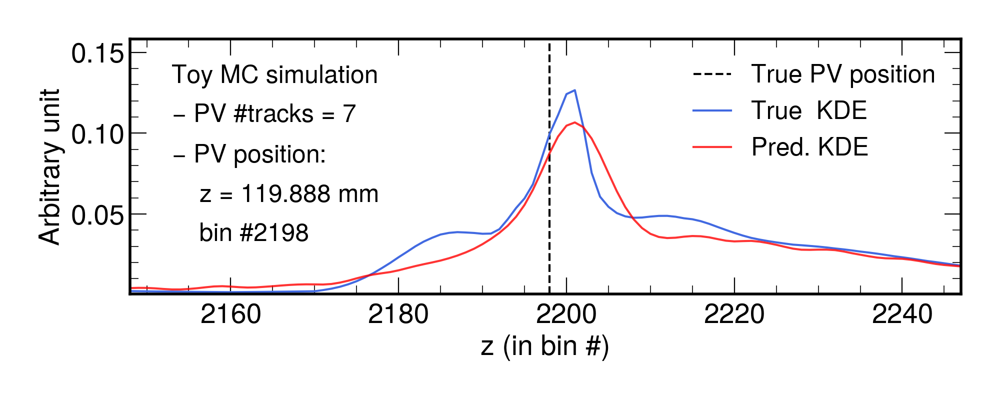

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  6


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


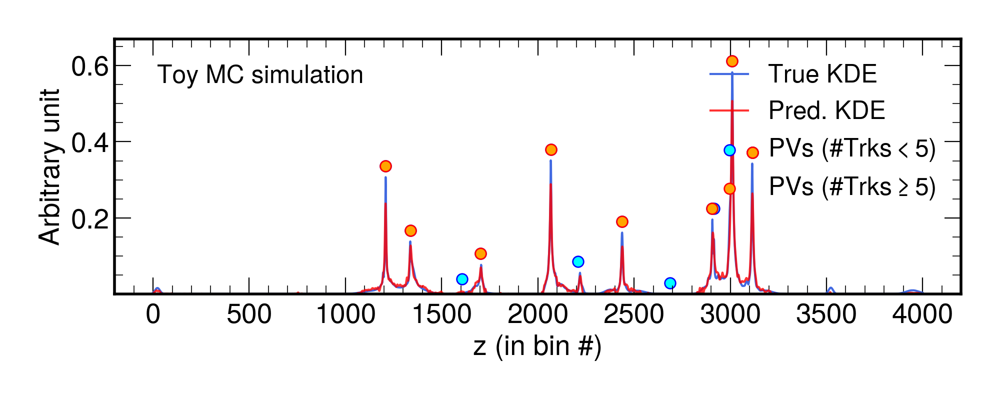

0.58203125 0.5070285
0.58203125


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (20.87808, 1, 12) 1208.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


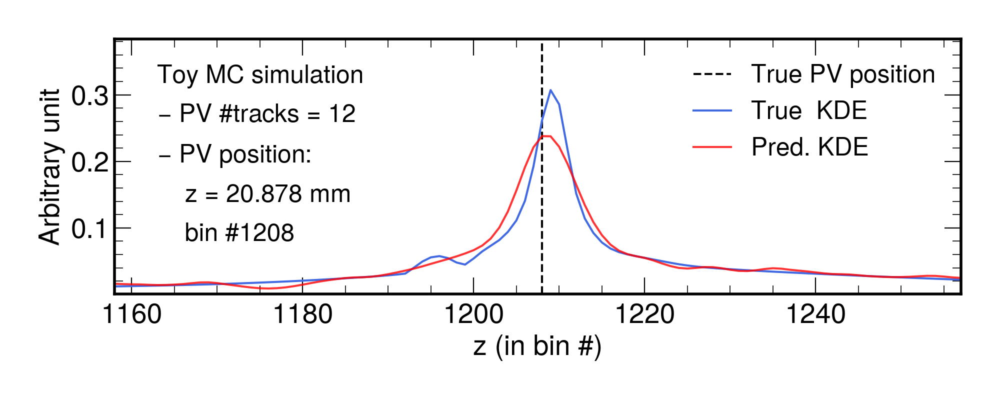

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (33.832314, 1, 10) 1338.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (70.358154, 1, 6) 1703.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


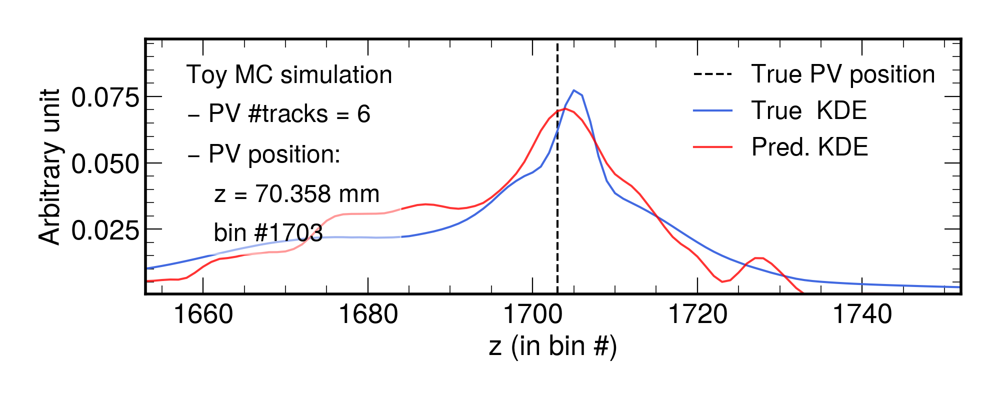

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (106.841064, 1, 18) 2068.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (143.757, 1, 9) 2437.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


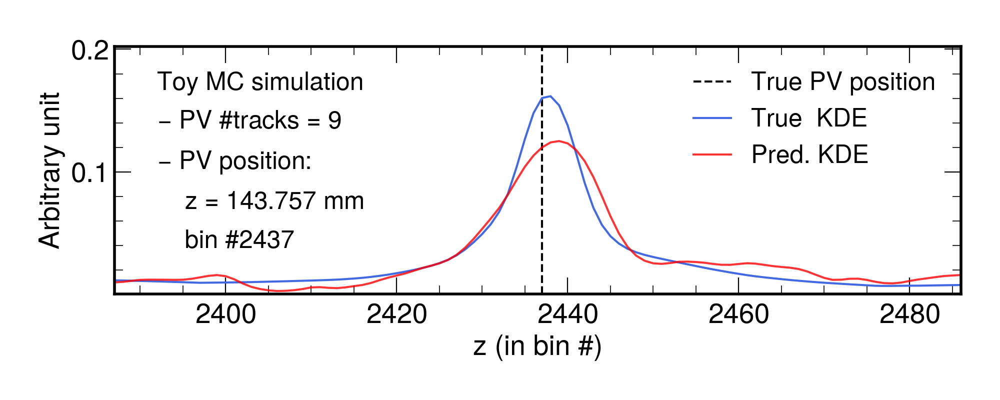

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (190.69218, 1, 10) 2906.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


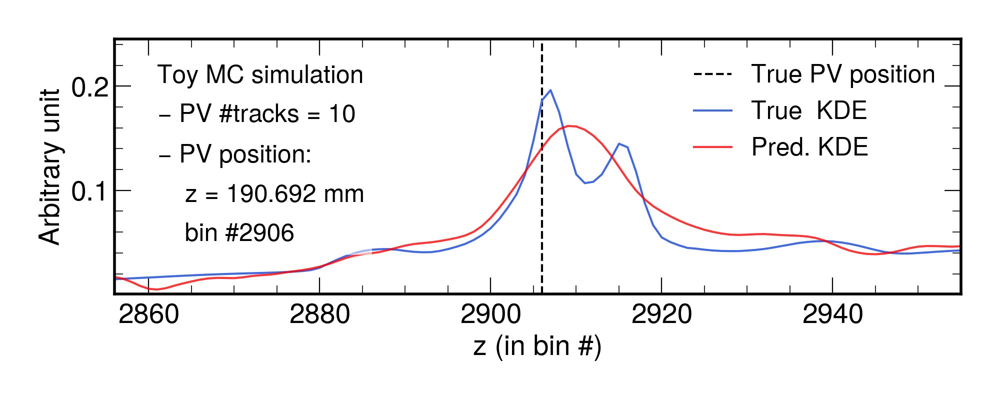

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (201.03218, 1, 42) 3010.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


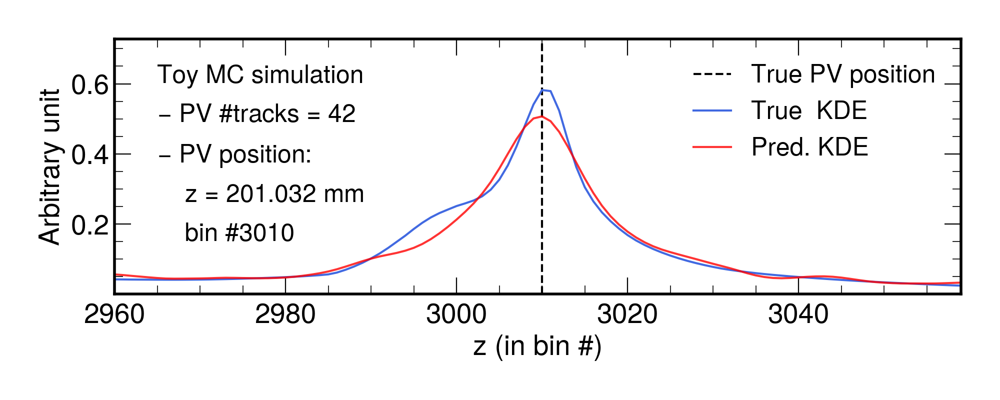

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (211.52026, 1, 24) 3115.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


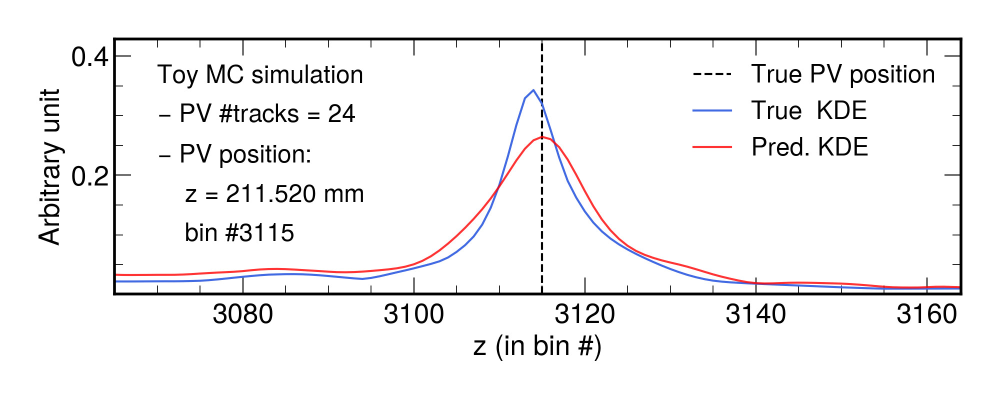

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  7


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


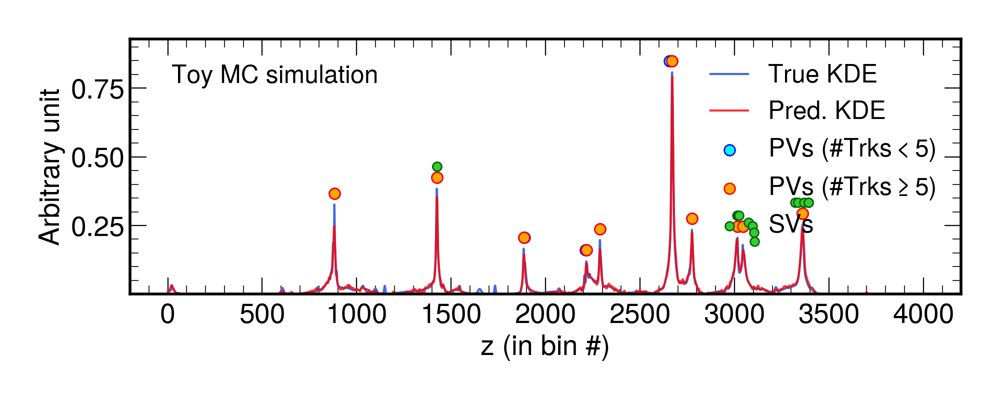

0.8071289 0.7902939
0.8071289


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (-11.716351, 1, 16) 882.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


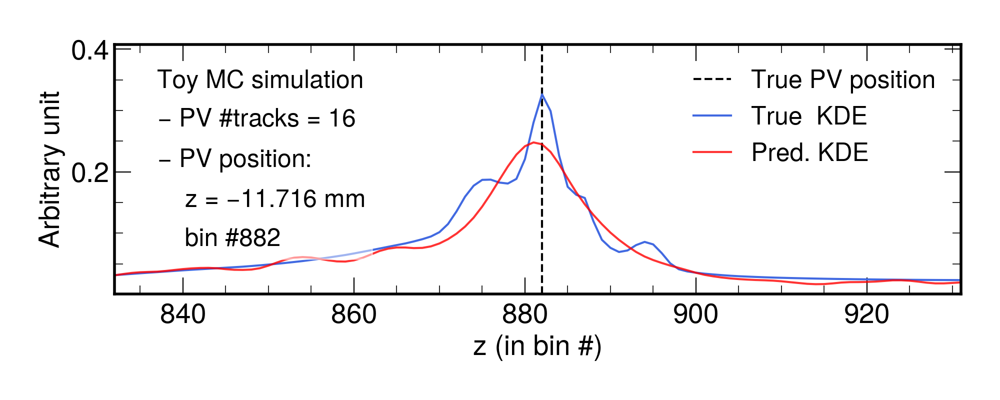

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (42.573463, 1, 24) 1425.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


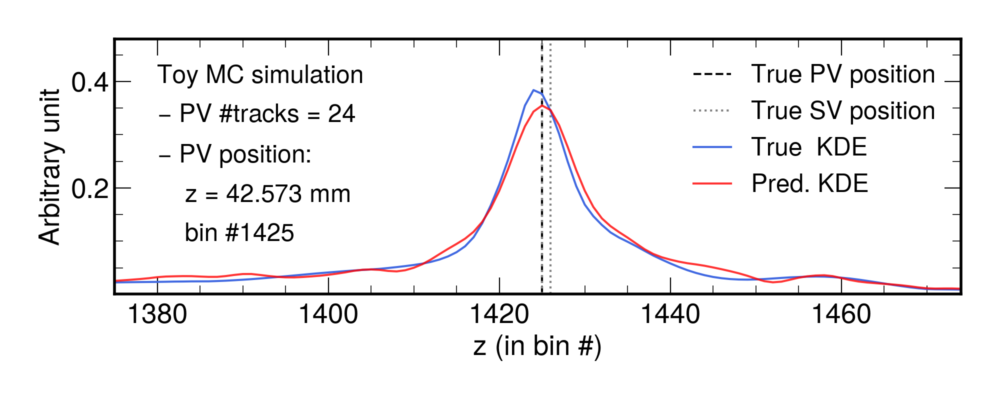

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (88.69835, 1, 12) 1886.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (121.63878, 1, 6) 2216.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


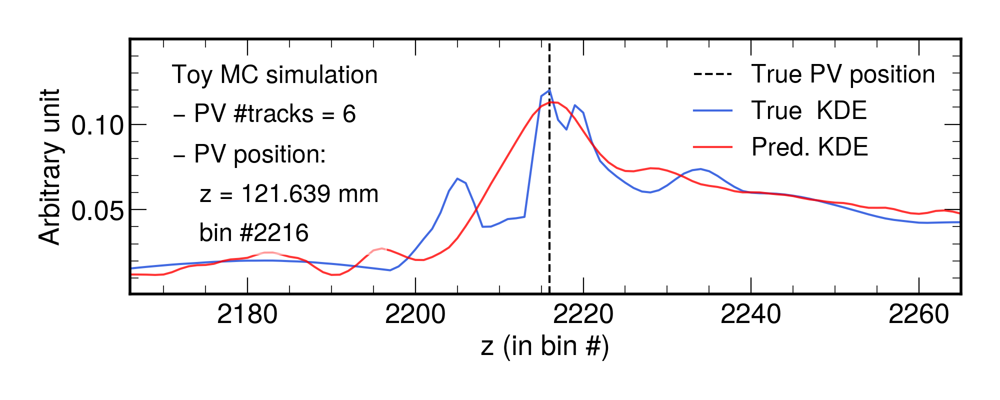

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (128.9197, 1, 17) 2289.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


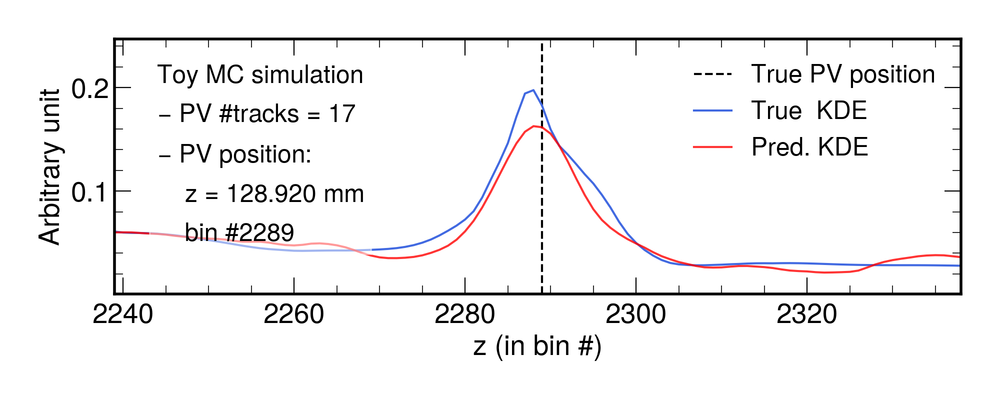

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (167.05272, 1, 54) 2670.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (177.61714, 1, 16) 2776.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


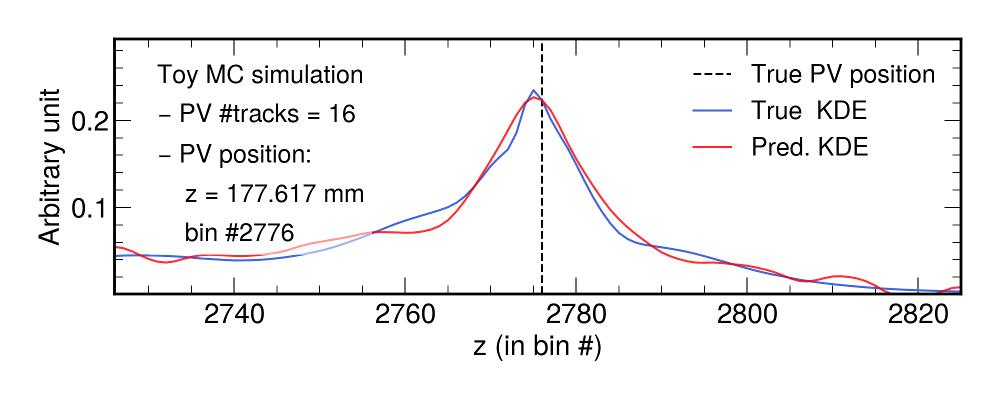

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (201.59529, 1, 27) 3015.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (204.43166, 1, 10) 3044.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


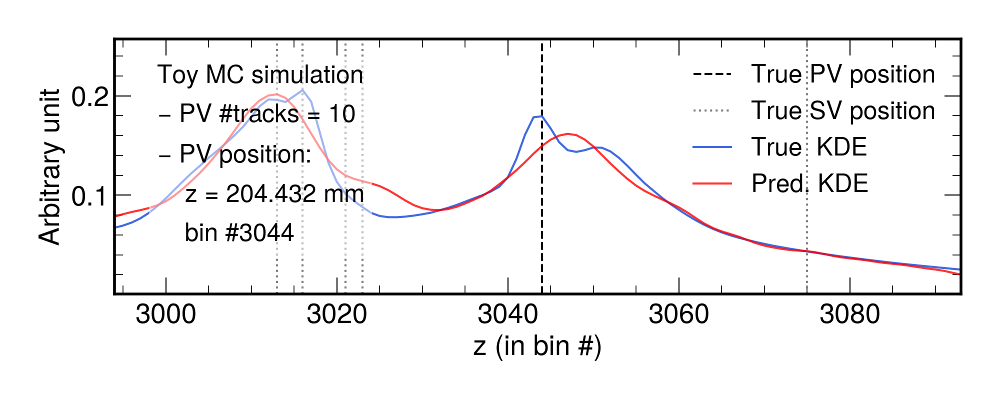

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (235.99078, 1, 30) 3359.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  8


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


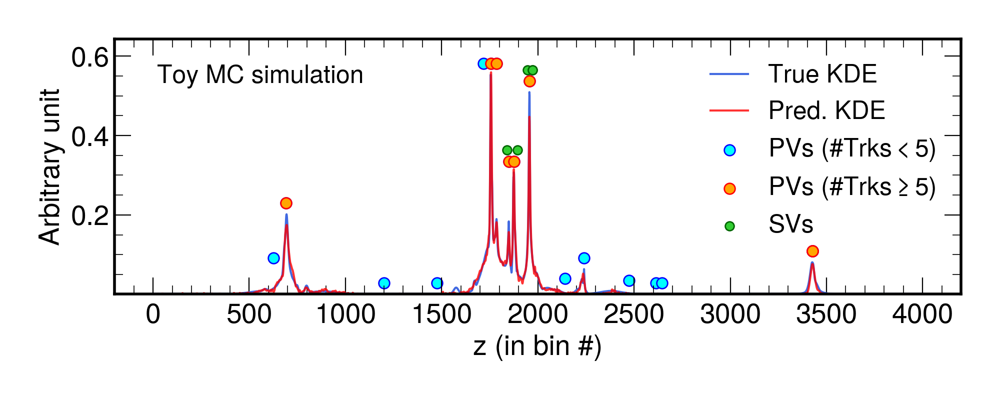

0.55322266 0.5592902
0.5592902


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (-30.833107, 1, 27) 691.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


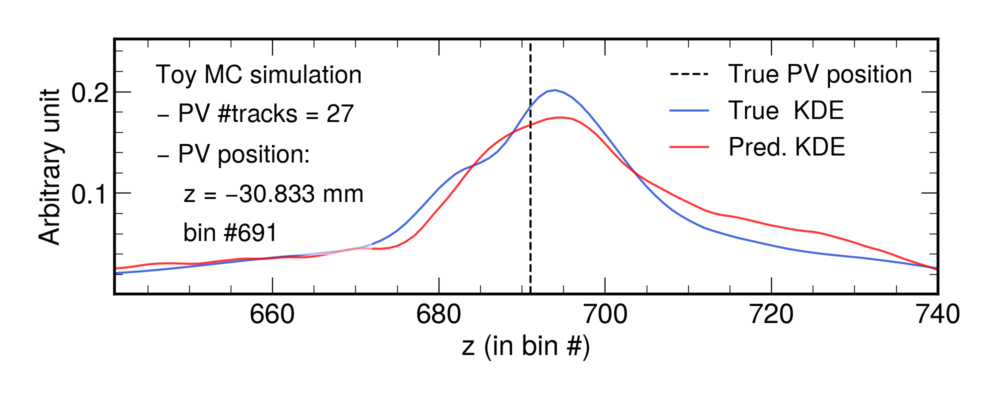

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (75.72543, 1, 40) 1757.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (78.57856, 1, 10) 1785.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (85.04041, 1, 7) 1850.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (87.73888, 1, 14) 1877.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (95.64741, 1, 33) 1956.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (242.70158, 1, 10) 3427.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  9


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

0.30981445 0.25147018
0.30981445


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (6.831851, 1, 6) 1068.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (52.842373, 1, 11) 1528.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (64.77767, 1, 5) 1647.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (85.844925, 1, 12) 1858.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (98.035645, 1, 20) 1980.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (105.69117, 1, 12) 2056.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (148.32233, 1, 6) 2483.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  10


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

0.21057129 0.18558635
0.21057129


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (20.374166, 1, 7) 1203.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (27.567453, 1, 20) 1275.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (29.429407, 1, 9) 1294.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (38.267292, 1, 9) 1382.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (65.5347, 1, 5) 1655.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (118.7442, 1, 15) 2187.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (126.40526, 1, 8) 2264.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  11


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

0.57666016 0.50993747
0.57666016


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (15.496153, 1, 14) 1154.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (87.49245, 1, 7) 1874.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (143.02481, 1, 38) 2430.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (164.62773, 1, 11) 2646.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (189.21928, 1, 5) 2892.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (199.7986, 1, 12) 2997.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (229.8197, 1, 7) 3298.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  12


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

0.5800781 0.51410824
0.5800781


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (43.52024, 1, 18) 1435.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (61.6468, 1, 25) 1616.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (70.30798, 1, 46) 1703.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (91.86758, 1, 12) 1918.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (111.82904, 1, 6) 2118.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (118.21203, 1, 16) 2182.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (124.372406, 1, 25) 2243.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (192.27272, 1, 22) 2922.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  13


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

1.0380859 0.98462635
1.0380859


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (-28.805237, 1, 14) 711.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (42.971806, 1, 6) 1429.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (51.872494, 1, 33) 1518.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (59.76336, 1, 8) 1597.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (63.70361, 1, 57) 1637.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (63.856552, 1, 31) 1638.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (68.06515, 1, 15) 1680.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (72.16228, 1, 5) 1721.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (90.52317, 1, 9) 1905.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (93.5521, 1, 6) 1935.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (106.85102, 1, 21) 2068.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (135.52019, 1, 28) 2355.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (189.59404, 1, 10) 2895.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (227.74701, 1, 7) 3277.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (247.91692, 1, 12) 3479.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  14


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

0.58203125 0.5200951
0.58203125


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (-2.9785845, 1, 15) 970.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (39.71369, 1, 5) 1397.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (55.958477, 1, 22) 1559.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (101.23165, 1, 12) 2012.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (107.9523, 1, 52) 2079.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (116.72603, 1, 19) 2167.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (142.39899, 1, 11) 2423.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  15


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

0.8183594 0.66820496
0.8183594


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (-46.86589, 1, 8) 531.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (37.175144, 1, 44) 1371.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (60.31548, 1, 35) 1603.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (108.68102, 1, 7) 2086.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (139.52173, 1, 9) 2395.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  16


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

0.7421875 0.62066567
0.7421875


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (72.55859, 1, 20) 1725.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (105.55552, 1, 17) 2055.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (111.20844, 1, 5) 2112.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (130.48965, 1, 23) 2304.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (133.92406, 1, 9) 2339.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (145.19243, 1, 45) 2451.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (179.83972, 1, 19) 2798.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (196.28546, 1, 67) 2962.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  17


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

0.34326172 0.39332178
0.39332178


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (35.63284, 1, 12) 1356.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (146.31349, 1, 8) 2463.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (168.88501, 1, 30) 2688.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  18


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

0.59814453 0.49481386
0.59814453


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (-20.93888, 1, 9) 790.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (80.21014, 1, 22) 1802.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (96.62931, 1, 5) 1966.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (109.19008, 1, 36) 2091.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (152.77602, 1, 16) 2527.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


iEvt =  19


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

0.67871094 0.6105643
0.67871094


'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (93.02522, 1, 16) 1930.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (112.82054, 1, 23) 2128.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (112.98631, 1, 32) 2129.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (120.54636, 1, 18) 2205.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


PV position and bin # =  (151.55853, 1, 7) 2515.0


/data/conda/envs/goofit-june2020/lib/python3.7/site-packages/ipykernel_launcher.py:182: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

'texgyreheros-regular.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


In [20]:
nFeatures = 4000
nTracks_good_PV = 5
maxEvt = 20
plt_name = ''
fsize = 18
fsize_ax = 20
plotSV = True

#for it in iters:
#    plt_name+='%s_'%(it)

from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})

with torch.no_grad():

    #print("val_loader = ",val_loader)
    # Loop over the trained iterations to retrieve the predictions 
    for it in iters:
        outputs[it] = models[it](val_loader.dataset.tensors[0])

    # Get the number of events from the output of the first trained model 
    nEvts = outputs[iters[0]].shape[0]
    #nEvts = 5

    print("nEvts = ",nEvts)
    labels = val_loader.dataset.tensors[1]

    # Do something on the true distribution (KDEs) 
    y = labels.view(nEvts,-1,nFeatures)
    y = y.transpose(1,2)               
    #print("y.shape = ",y.shape)

    # ========================
    # ========================
    # --- LOOP over the events
    # ========================
    # ========================
    for iEvt in range(maxEvt):

        print("iEvt = ",iEvt)

        # --- Retrieve the TRUE KDEs
        y_kde = y[iEvt,:,0].cpu().numpy()

        # --- Retrieve the PREDICTED KDEs for each trained model (iteration over same model)
        for it in iters:
            y_pred[it] = outputs[it][iEvt,:]
            y_pred[it] = y_pred[it].cpu().numpy()

        # --- Containers usefull for plotting
        pv_sorted = sorted(zip(PV.z[iEvt],PV.cat[iEvt],PV.n[iEvt]), key=lambda x: x[0])
        n_pvs = len(pv_sorted)
        good_pvs = []
        good_pv_bins = []
        pv_sorted_bins = []

        # --- LOOP over all PVs
        for ii in range(n_pvs):

            pv_sorted_bins.append(np.floor(10.*(pv_sorted[ii][0]+100)))

            # PV with at least 5 tracks are considered as good PVs
            # Can also filter using "pv_sorted[ii][1]", which is a boolean at 1 if nTracks_good_PV is >= 5
            if pv_sorted[ii][2]>=nTracks_good_PV:
                good_pvs.append(pv_sorted[ii])
                good_pv_bins.append(np.floor(10.*(pv_sorted[ii][0]+100)))

        n_good_pv_bins = len(good_pv_bins)

        sv_sorted = sorted(zip(SV.z[iEvt],SV.cat[iEvt],SV.n[iEvt]), key=lambda x: x[0])
        n_svs = len(sv_sorted)
        sv_sorted_bins = []
        # --- LOOP over all SVs
        for ii in range(n_svs):
            sv_sorted_bins.append(np.floor(10.*(sv_sorted[ii][0]+100)))

        # ==============================
        # --- Start plotting things here
        # ==============================
        fig, ax = plt.subplots()
        max_y_kde = max(y_kde)
        max_y_pred = 0
        for it in iters:
            max_y_pred = max(y_pred[it])

        print(max_y_kde,max_y_pred)
        max_y = max(max_y_kde,max_y_pred)
        print(max_y)

        plt.ylim(0.0005,1.15*max_y)

        pvstr = "PVs" # tag for the text box info on the plot
        if len(good_pv_bins)<=1:
            pvstr = "PV"

        # --- Add the true KDE distribution
        plt.plot(y_kde, color="royalblue", label="True KDE")

        # --- Add the predicted KDE distributions (for each model iteration)
        for it in iters:
            if len(iters)>1:
                plt.plot(y_pred[it], color=mycolors[it], alpha = 0.8, label="Pred. KDE (iter %s)"%(it))
            else:
                plt.plot(y_pred[it], color=mycolors[it], alpha = 0.8, label="Pred. KDE")

        # --- Add markers showing the PVs position
        # - LOOP over all PVs
        for ipv in range(n_pvs):
            xPV = pv_sorted_bins[ipv]
            yPV = max(y_kde[int(xPV)-50:int(xPV)+50]) + 0.05*max_y
            plt.scatter((xPV),(yPV), s=61, marker = "o", color="blue", facecolor="cyan")
            #color = 'blue', marker = "o", markersize=8, markerfacecolor="cyan"
        # Add once more the last PV with the label for legend purpose (not ideal, but it works...)
        if n_pvs>n_good_pv_bins:
            plt.scatter((xPV),(yPV), s=61, marker = "o", color="blue", facecolor="cyan", label='%s (#Trks$<%s$)'%(pvstr,nTracks_good_PV))

        # - LOOP over good PVs
        for ipv in range(n_good_pv_bins):
            xPV = good_pv_bins[ipv]
            yPV = max(y_kde[int(xPV)-50:int(xPV)+50]) + 0.05*max_y
            plt.scatter((xPV),(yPV), s=61, marker="o", color="red", facecolor="orange")
        # Add once more the last goo PV with the label for legend purpose (not ideal, but it works...)
        plt.scatter((xPV),(yPV), s=61, marker="o", color="red", facecolor="orange", label='%s (#Trks$\geq%s$)'%(pvstr,nTracks_good_PV))

        # - LOOP over all SVs
        if plotSV:
            for isv in range(n_svs):
                xSV = sv_sorted_bins[isv]
                ySV = max(y_kde[int(xSV)-50:int(xSV)+50]) + 0.1*max_y
                plt.scatter((xSV),(ySV), s=41, marker = "o", color="darkgreen", facecolor="limegreen")
                #color = 'blue', marker = "o", markersize=8, markerfacecolor="cyan"
            # Add once more the last PV with the label for legend purpose (not ideal, but it works...)
            if n_svs>0:
                plt.scatter((xSV),(ySV), s=41, marker = "o", color="darkgreen", facecolor="limegreen", label='SVs')

        # --- Add the legend (in the upper-right corner: 'loc=1')
        plt.legend(loc=1, facecolor='white', edgecolor='white', fontsize=fsize)

        # --- Text box info added on the top left part of the plot, with
        # - event number
        # - number of good PVs out of the total number of PVs for the event
        textstr = '\n'.join((
        r'Toy MC simulation',     
        #r'',     
        #r'Evt #%s' % (iEvt, ),     
        #r'$-$ %s good %s (of %s)' %(len(good_pv_bins),pvstr,len(pv_sorted)) 
        ))              
        props = dict(boxstyle='square', facecolor='white', edgecolor='white', alpha=0.5) #
        ax.text(0.05, 0.90, textstr, transform=ax.transAxes,verticalalignment='top', bbox=props,linespacing = 1.8, fontsize=fsize)

        # --- Set the plot x- and y-axis labels
        ax.set_xlabel("z (in bin #)", fontsize=fsize_ax)
        ax.set_ylabel("Arbitrary unit", fontsize=fsize_ax)
        for tick in ax.xaxis.get_major_ticks():
            tick.label1.set_fontsize(fsize_ax)
        for tick in ax.yaxis.get_major_ticks():
            tick.label1.set_fontsize(fsize_ax)

        # --- Save the plot 
        fname = 'Evt%s'%(iEvt)
        plt.savefig(str(output_path / f'{fname}.png'))
        plt.savefig(str(output_path / f'{fname}.pdf'))


        # =====================================================
        # =====================================================
        # --- Make the zoomed in plots for each of the good PV
        # =====================================================
        # =====================================================
        for jj in range(n_good_pv_bins):
            print("PV position and bin # = ", good_pvs[jj], good_pv_bins[jj])

            # Low bin number edge
            nLow =  int(good_pv_bins[jj]-50)
            # High bin number edge
            nHigh = int(good_pv_bins[jj]+50)
            # Set the range of x according to the low bin edge + 100 bins, 
            # i.e. a list of 100 values iterating 1 from nLow
            x=[i+nLow for i in range(100)]

            fig, ax = plt.subplots()
            plt.xlim(x[0],x[99])
            plt.ylim(0.0005,1.25*max(y_kde[nLow:nHigh]))

            # --- Add vertical line showing the good PV position
            plt.axvline(x=good_pv_bins[jj], color='black', linestyle='dashed', label="True PV position")

            if plotSV:
                SVhere = False
                for isv in range(n_svs):
                    xSV = sv_sorted_bins[isv]
                    if xSV >= x[0] and xSV <= x[99]:
                        if not SVhere:
                            plt.axvline(x=xSV, color='grey', linestyle='dotted', label="True SV position")
                            SVhere = True
                        else:
                            plt.axvline(x=xSV, color='grey', linestyle='dotted')


            # --- Add the true KDE distribution
            plt.plot(x,y_kde[nLow:nHigh], color="royalblue", label="True  KDE")

            # --- Add the predicted KDE distributions (for each model iteration)
            for it in iters:
                if len(iters)>1:
                    plt.plot(x,y_pred[it][nLow:nHigh], color=mycolors[it], alpha = 0.8, label="Pred. KDE (iter %s)"%(it))
                else:
                    plt.plot(x,y_pred[it][nLow:nHigh], color=mycolors[it], alpha = 0.8, label="Pred. KDE")

            # --- Add the legend (in the upper-right corner: 'loc=1')
            plt.legend(loc=1, facecolor='white', edgecolor='white', fontsize=fsize)

            # --- Text box info added on the top left part of the plot, with
            # - PV number
            # - number of tracks origiating from the PV
            # - PV position (in z and bin number)
            textstr = '\n'.join((
            r'Toy MC simulation',     
            #r'',     
            #r'Evt #%s' % (iEvt, ),     
            #r'$-$ PV #%s (of %s)' %(jj+1,n_good_pv_bins ),
            r'$-$ PV #tracks = %s' % (good_pvs[jj][2], ),     
            r'$-$ PV position:',              
            r'    z = $%.3f$ mm' % (good_pvs[jj][0]),             
            r'    bin #%.0f' % (good_pv_bins[jj])))              
            #r'PV_bin = %.0f' % (good_pv_bins[jj], )))            
            props = dict(boxstyle='square', facecolor='white', edgecolor='white', alpha=0.5) #
            ax.text(0.05, 0.90, textstr, transform=ax.transAxes, verticalalignment='top', bbox=props, linespacing = 1.8, fontsize=fsize)
            ax.set_xlabel("z (in bin #)", fontsize=fsize_ax)
            ax.set_ylabel("Arbitrary unit", fontsize=fsize_ax)
            for tick in ax.xaxis.get_major_ticks():
                tick.label1.set_fontsize(fsize_ax)
            for tick in ax.yaxis.get_major_ticks():
                tick.label1.set_fontsize(fsize_ax)
            fname = 'Evt%s_goodPV%s'%(iEvt,jj)
            plt.savefig(str(output_path / f'{fname}.png'))
            plt.savefig(str(output_path / f'{fname}.pdf'))
